In [0]:
import os
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
# %reload_ext tensorboard
import torch
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from random import sample
import glob
from skimage.io import imsave
import numpy as np
import pdb

DATASET_DIR = "/content/drive/My Drive/CIS 522 Project/dataset"
ROOT_LOG_DIR = "/content/drive/My Drive/CIS 522 Project/logs"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Dataloader


In [0]:
class BaselinePairDataset(Dataset):
  def __init__(self, full_dir, transform = None):
    image1 = []
    image2 = []
    for i in glob.glob(str(full_dir)+'*'):
      image1.append(i)
    for i in reversed(glob.glob(str(full_dir)+'*', )):
      image2.append(i)
    self.image1 = image1
    self.image2 = image2
    self.len = len(self.image1)

  def __len__(self):
    return self.len

  def __getitem__(self, idx):
    full1 = np.array(Image.open(self.image1[idx]).convert('RGB'))
    full2 = np.array(Image.open(self.image2[idx]).convert('RGB'))
    return full1, full2


In [0]:
# import torch.nn.functional as F
# import cv2
import scipy.misc

Values estimated from Cityscape Dataset


In [0]:
scale_values = [(1.0,1.0), (0.5,0.5), (1.4,1.4), (0.8,0.8), (1.0,1.0), (0.5,1.0), (0.8,1.4)]
rotation_values = [0.0, 0.05, -0.07, 0.22, -0.13, 0.11, -0.3]
translation_values = [(0,0),(50,0),(0,50),(-40,0),(40,40),(-60,30),(70,-10)]
shear_val = 0.2


RUNNING CELL


In [0]:
import imageio
# imageio.imwrite('filename.jpg', array)
# from PIL import Image

Run baseline to compose scenes, uncomment lines 37, 45, 50 and 60 to save the images at the mentinoed path in drive. The model taked in input images of full (non occluded ) segmented images from input dataset ("full folder")


Change pic idx in line 64 to change the number of instances being composed, here we create only 500 compositions. 

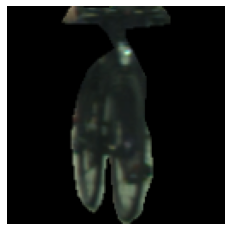

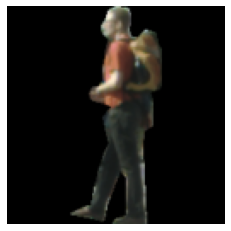

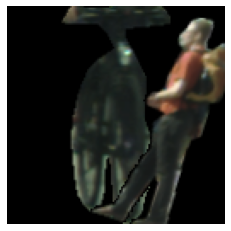

0 -----------------------------------------------------------------------------


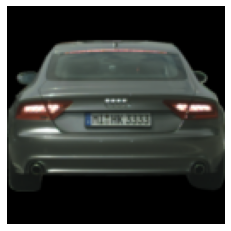

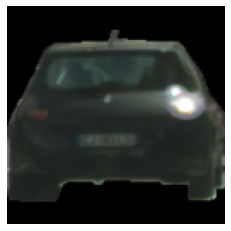

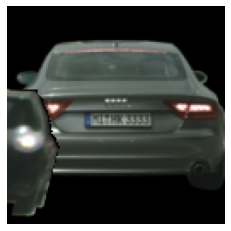

1 -----------------------------------------------------------------------------


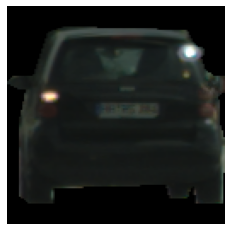

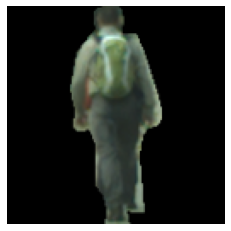

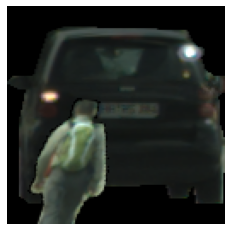

2 -----------------------------------------------------------------------------


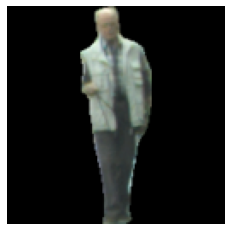

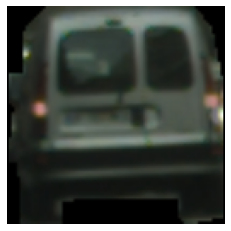

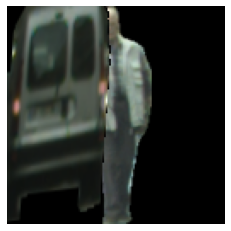

3 -----------------------------------------------------------------------------


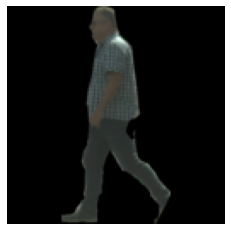

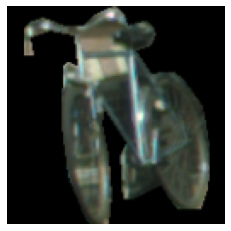

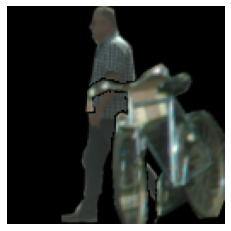

4 -----------------------------------------------------------------------------


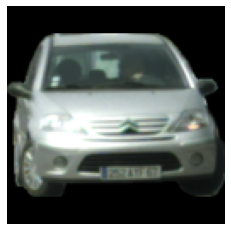

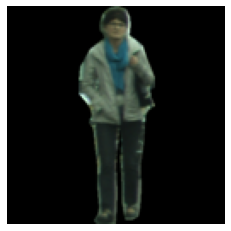

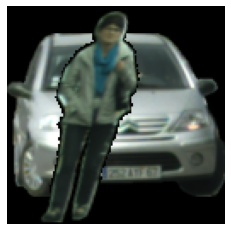

5 -----------------------------------------------------------------------------


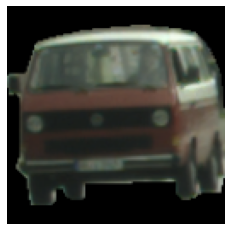

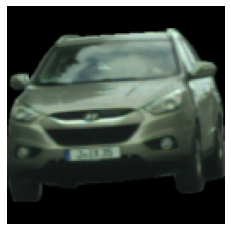

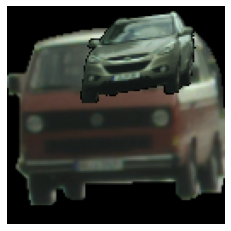

6 -----------------------------------------------------------------------------


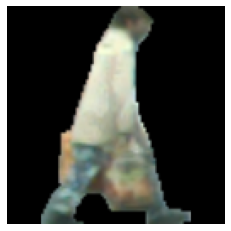

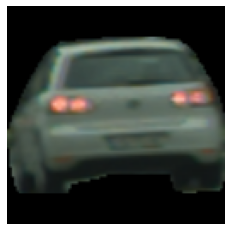

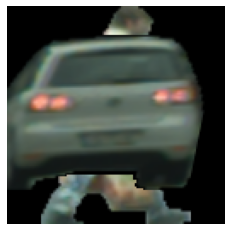

7 -----------------------------------------------------------------------------


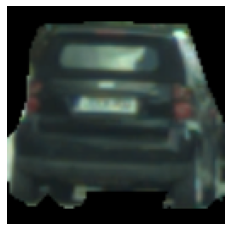

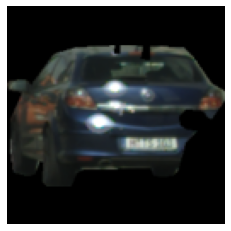

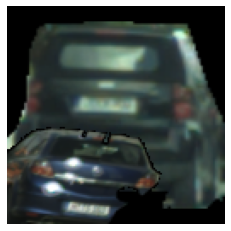

8 -----------------------------------------------------------------------------


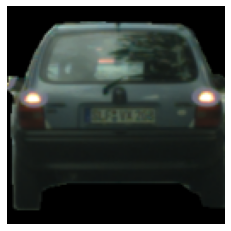

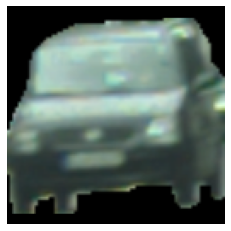

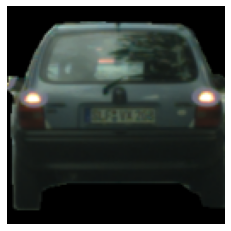

9 -----------------------------------------------------------------------------


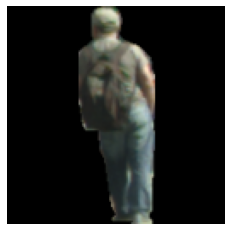

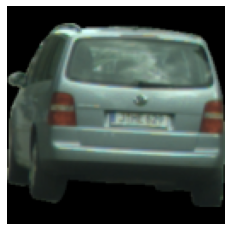

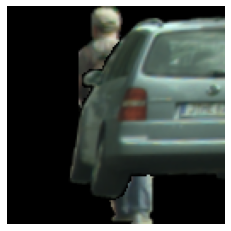

10 -----------------------------------------------------------------------------


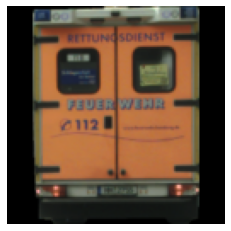

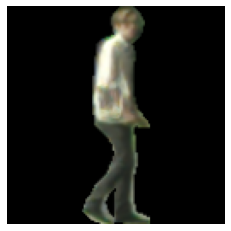

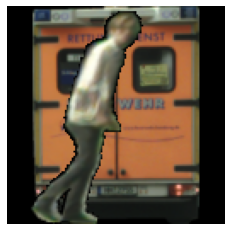

11 -----------------------------------------------------------------------------


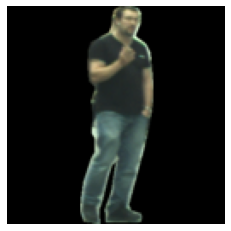

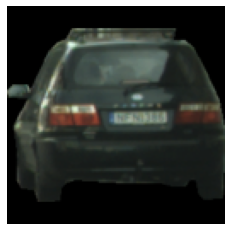

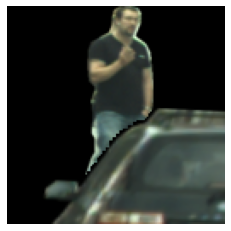

12 -----------------------------------------------------------------------------


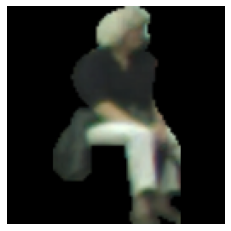

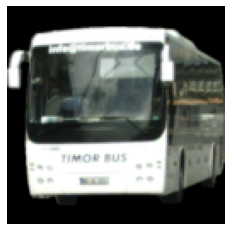

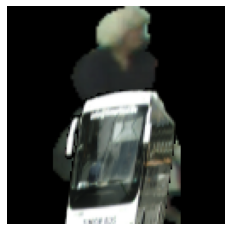

13 -----------------------------------------------------------------------------


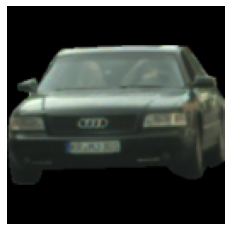

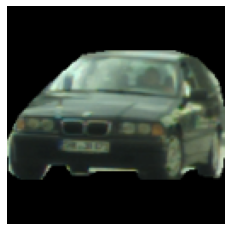

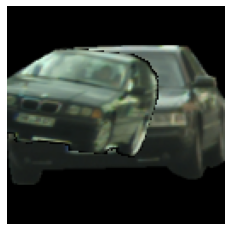

14 -----------------------------------------------------------------------------


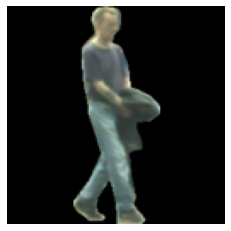

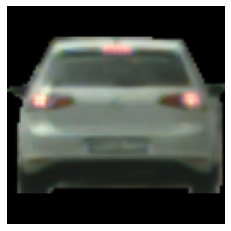

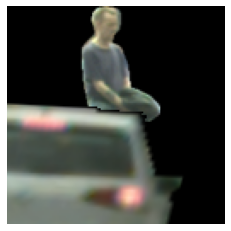

15 -----------------------------------------------------------------------------


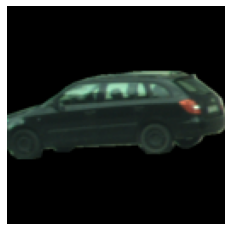

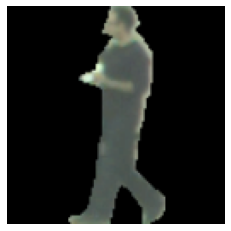

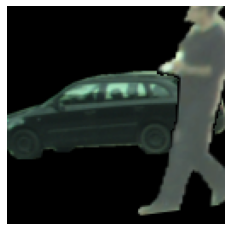

16 -----------------------------------------------------------------------------


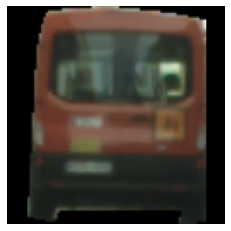

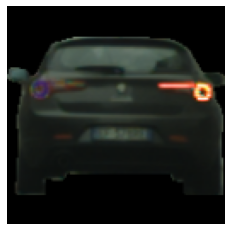

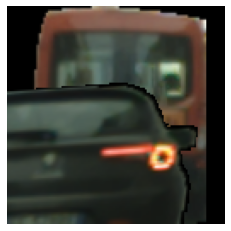

17 -----------------------------------------------------------------------------


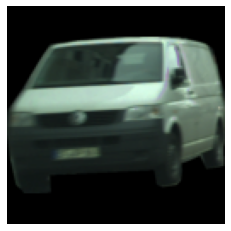

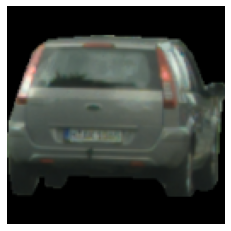

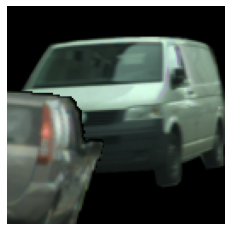

18 -----------------------------------------------------------------------------


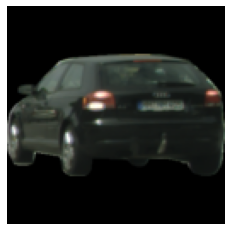

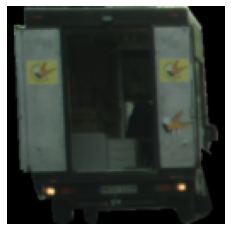

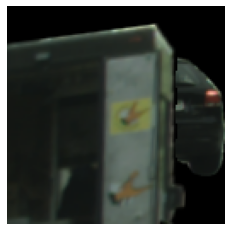

19 -----------------------------------------------------------------------------


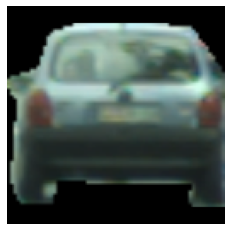

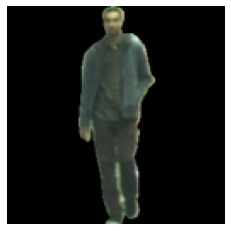

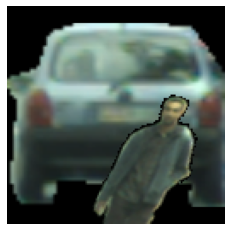

20 -----------------------------------------------------------------------------


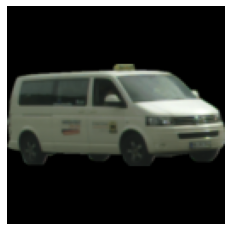

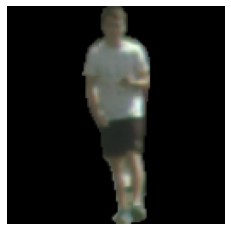

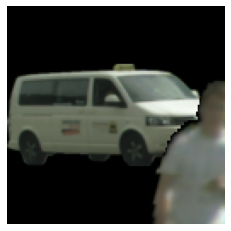

21 -----------------------------------------------------------------------------


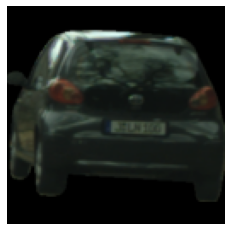

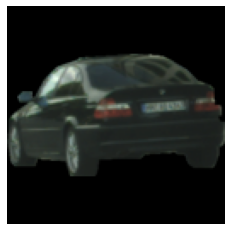

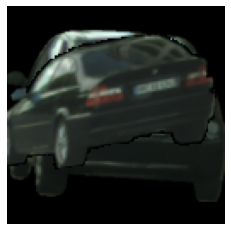

22 -----------------------------------------------------------------------------


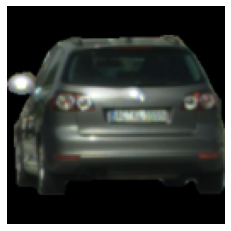

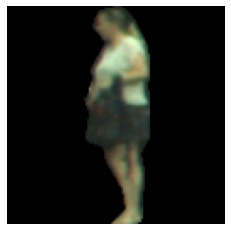

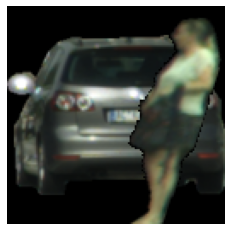

23 -----------------------------------------------------------------------------


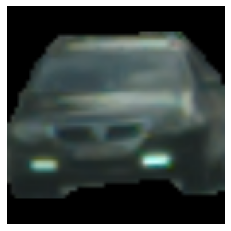

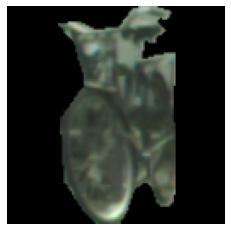

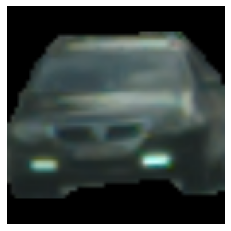

24 -----------------------------------------------------------------------------


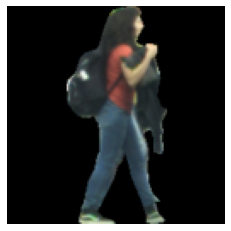

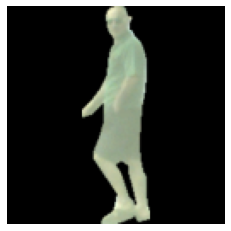

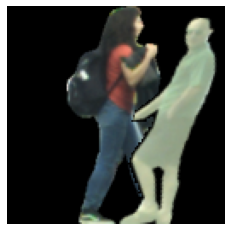

25 -----------------------------------------------------------------------------


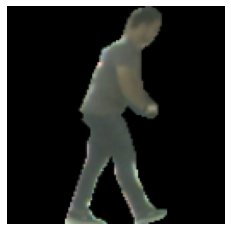

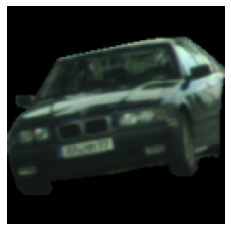

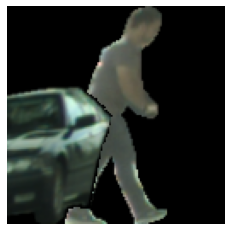

26 -----------------------------------------------------------------------------


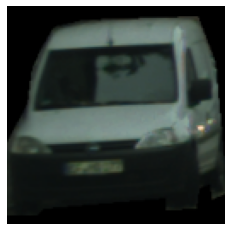

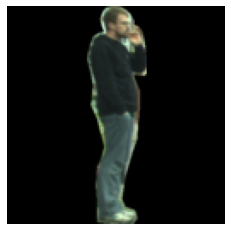

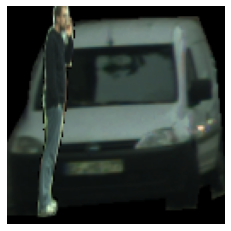

27 -----------------------------------------------------------------------------


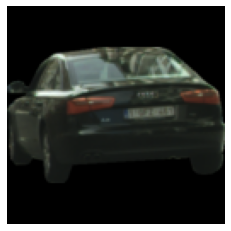

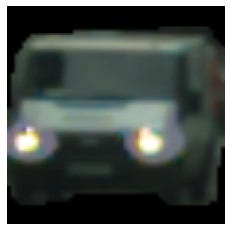

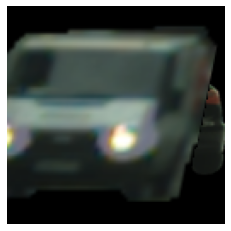

28 -----------------------------------------------------------------------------


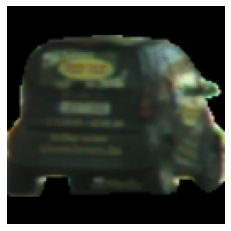

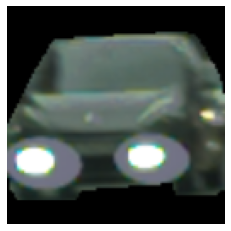

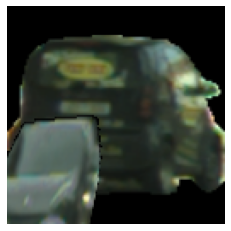

29 -----------------------------------------------------------------------------


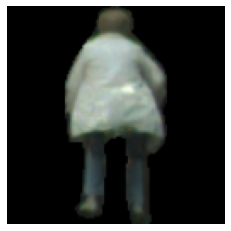

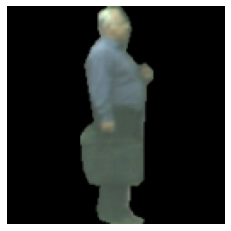

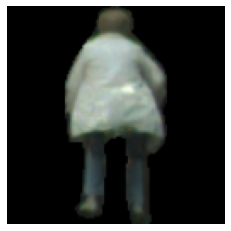

30 -----------------------------------------------------------------------------


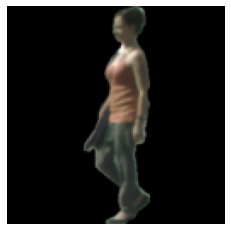

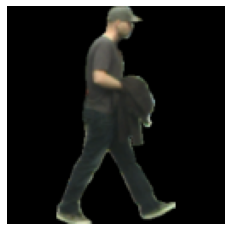

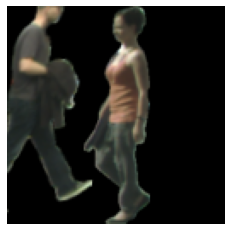

31 -----------------------------------------------------------------------------


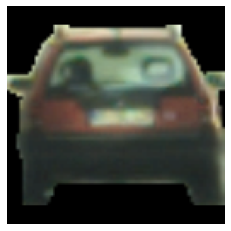

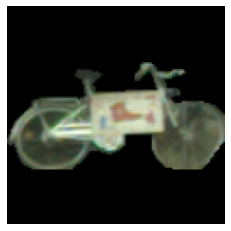

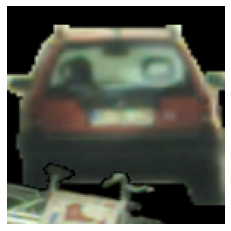

32 -----------------------------------------------------------------------------


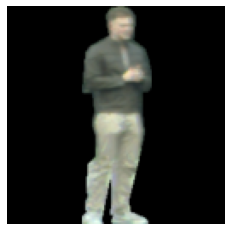

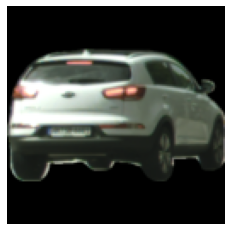

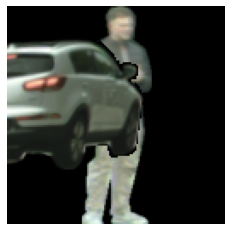

33 -----------------------------------------------------------------------------


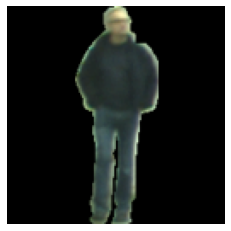

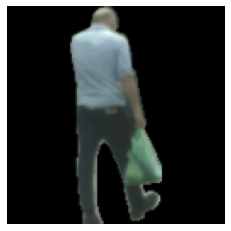

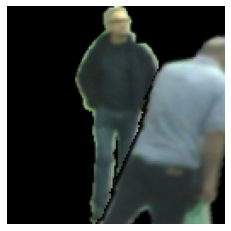

34 -----------------------------------------------------------------------------


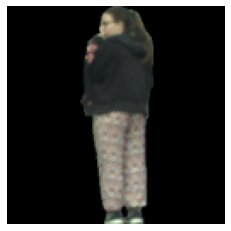

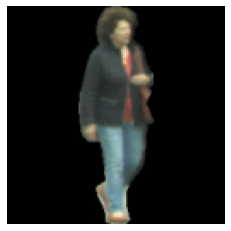

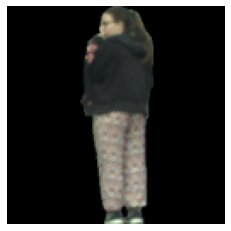

35 -----------------------------------------------------------------------------


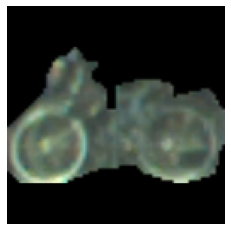

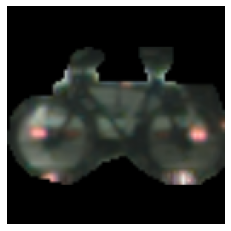

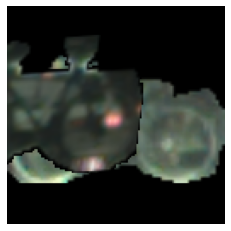

36 -----------------------------------------------------------------------------


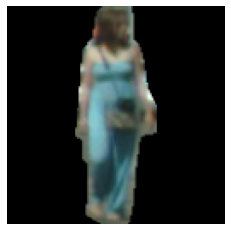

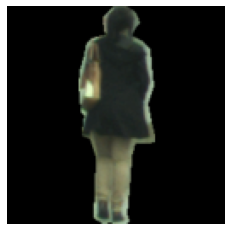

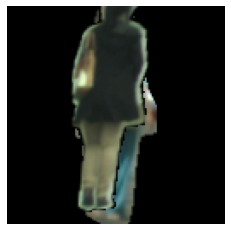

37 -----------------------------------------------------------------------------


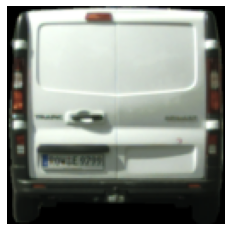

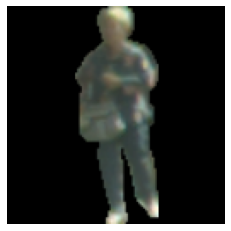

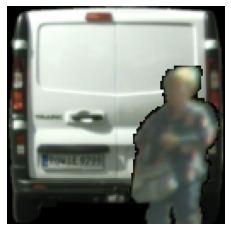

38 -----------------------------------------------------------------------------


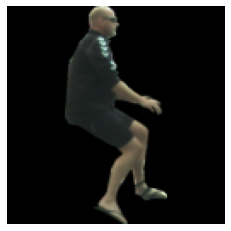

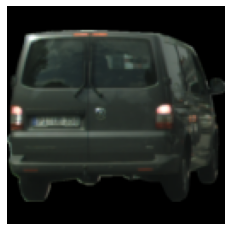

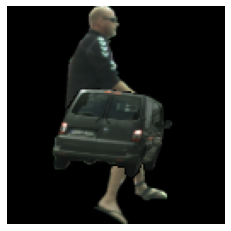

39 -----------------------------------------------------------------------------


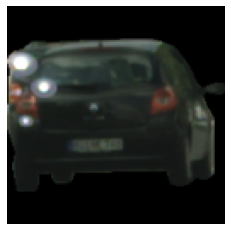

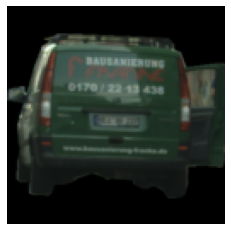

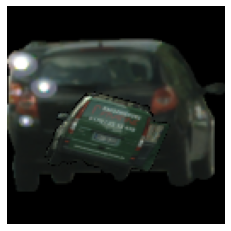

40 -----------------------------------------------------------------------------


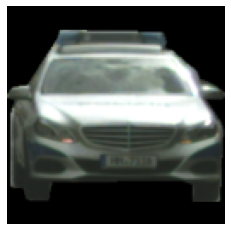

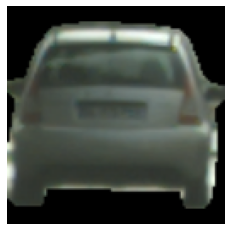

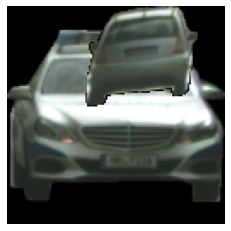

41 -----------------------------------------------------------------------------


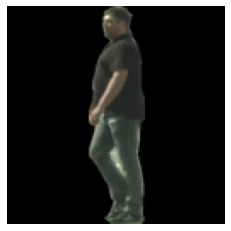

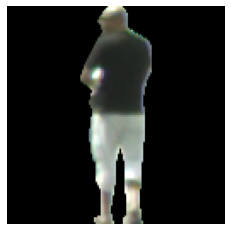

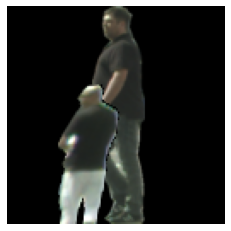

42 -----------------------------------------------------------------------------


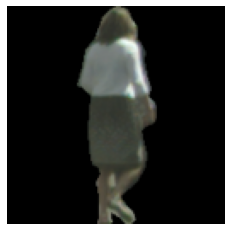

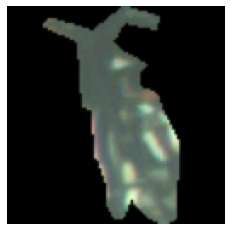

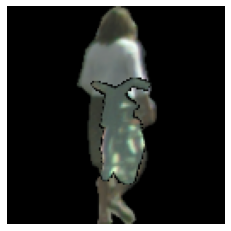

43 -----------------------------------------------------------------------------


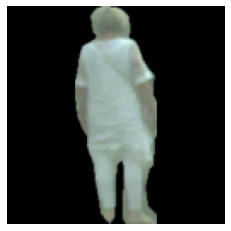

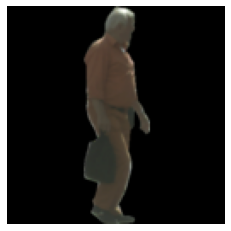

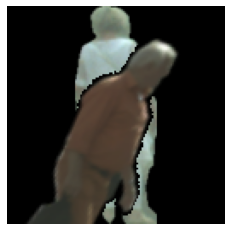

44 -----------------------------------------------------------------------------


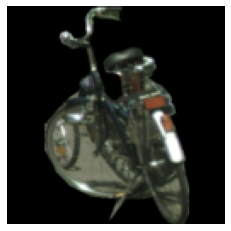

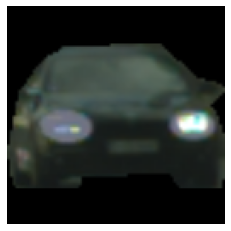

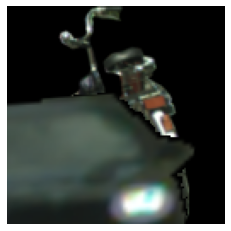

45 -----------------------------------------------------------------------------


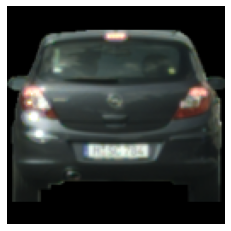

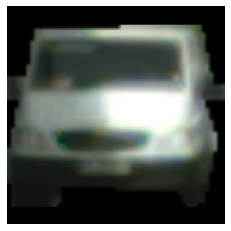

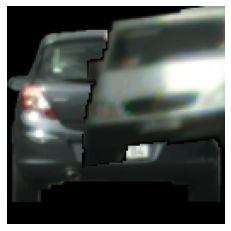

46 -----------------------------------------------------------------------------


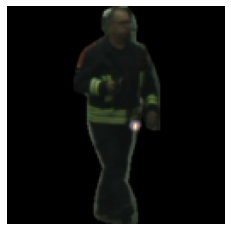

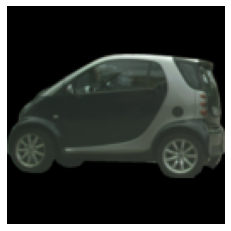

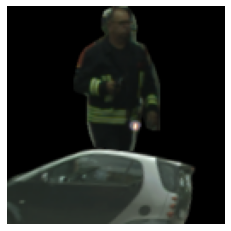

47 -----------------------------------------------------------------------------


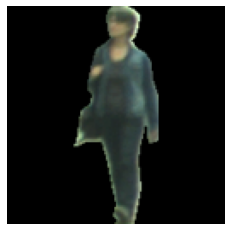

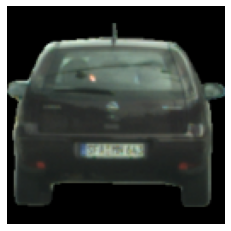

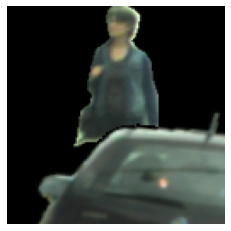

48 -----------------------------------------------------------------------------


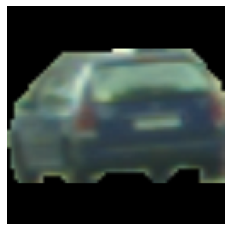

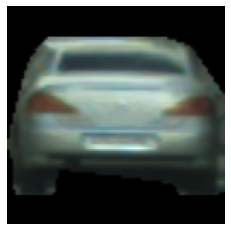

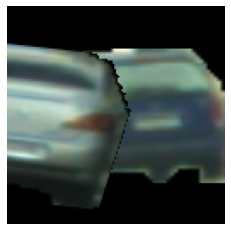

49 -----------------------------------------------------------------------------


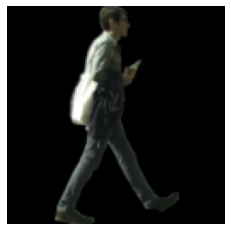

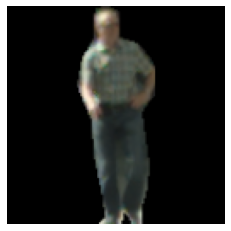

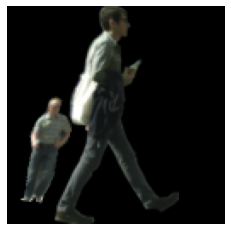

50 -----------------------------------------------------------------------------


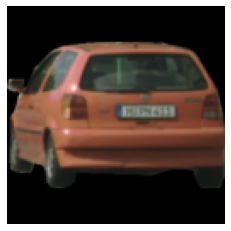

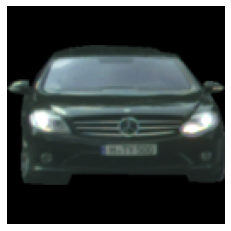

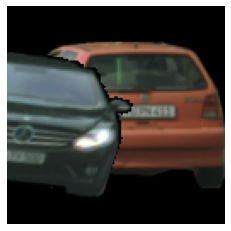

51 -----------------------------------------------------------------------------


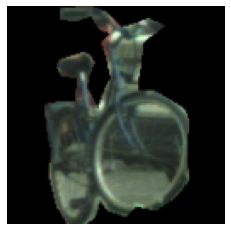

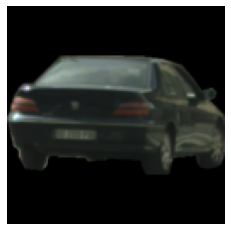

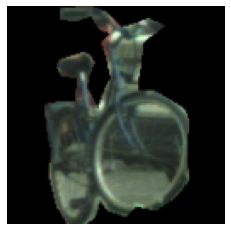

52 -----------------------------------------------------------------------------


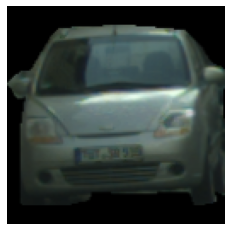

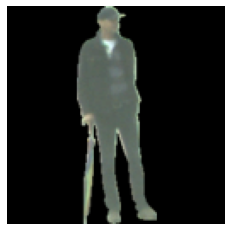

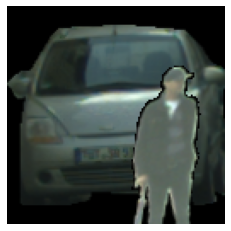

53 -----------------------------------------------------------------------------


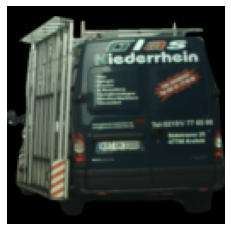

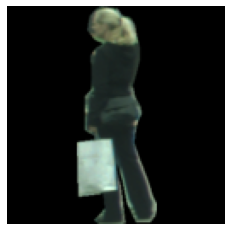

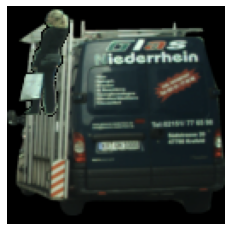

54 -----------------------------------------------------------------------------


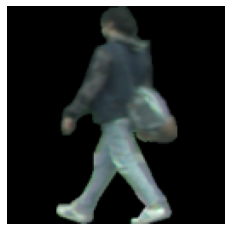

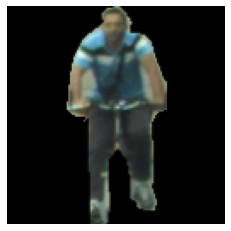

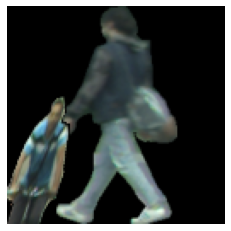

55 -----------------------------------------------------------------------------


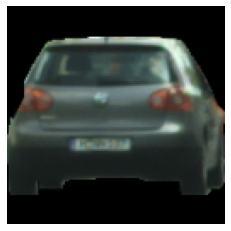

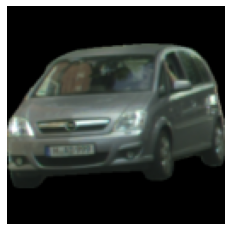

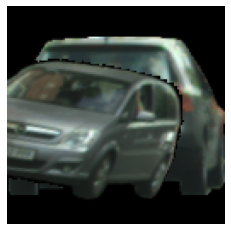

56 -----------------------------------------------------------------------------


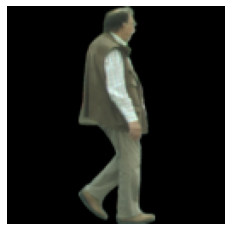

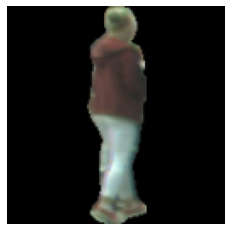

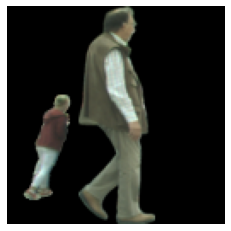

57 -----------------------------------------------------------------------------


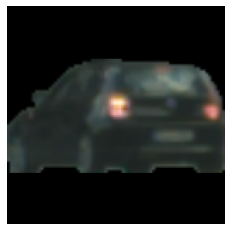

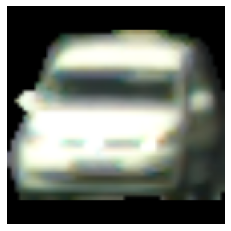

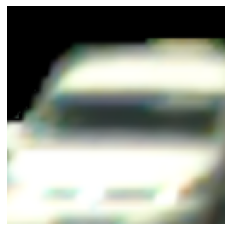

58 -----------------------------------------------------------------------------


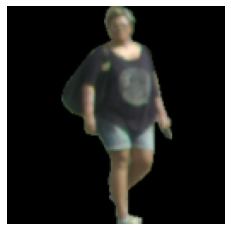

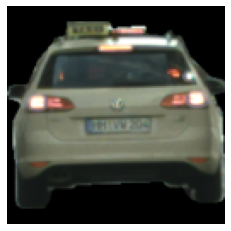

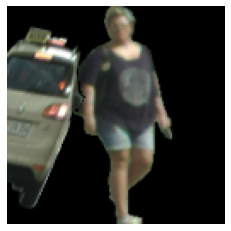

59 -----------------------------------------------------------------------------


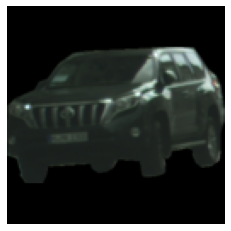

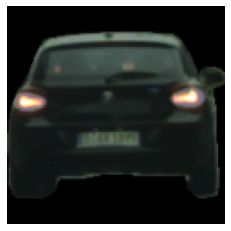

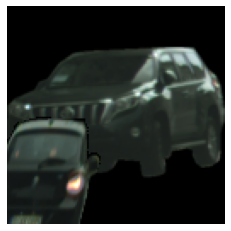

60 -----------------------------------------------------------------------------


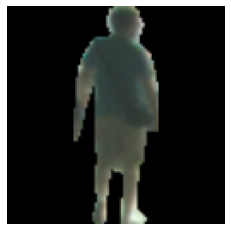

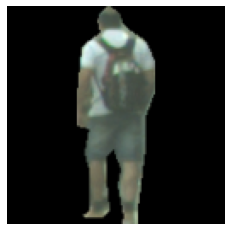

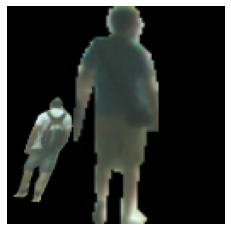

61 -----------------------------------------------------------------------------


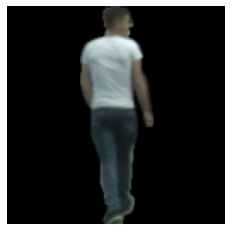

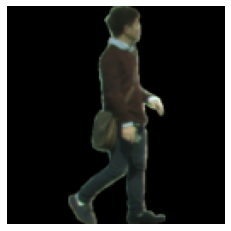

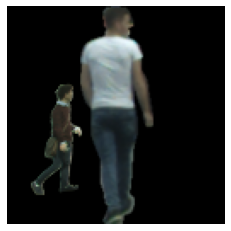

62 -----------------------------------------------------------------------------


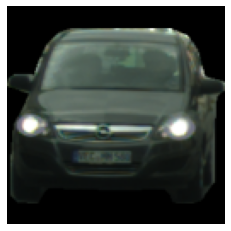

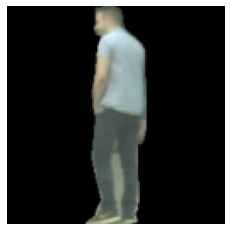

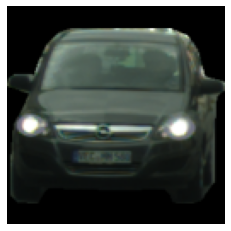

63 -----------------------------------------------------------------------------


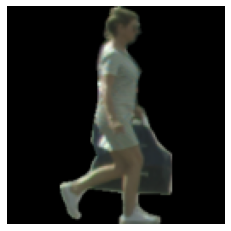

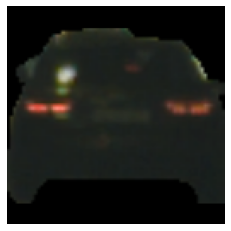

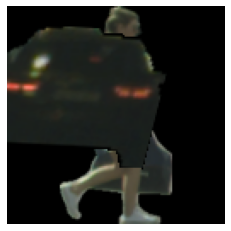

64 -----------------------------------------------------------------------------


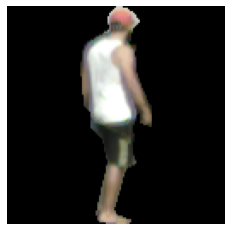

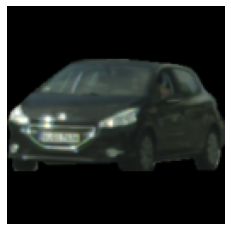

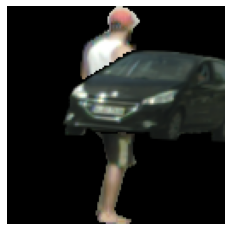

65 -----------------------------------------------------------------------------


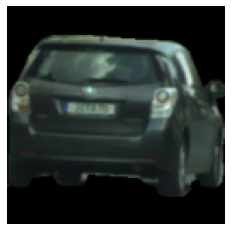

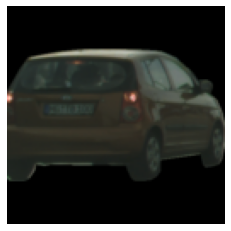

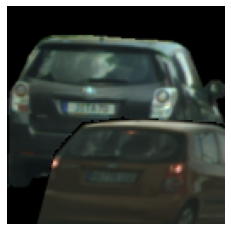

66 -----------------------------------------------------------------------------


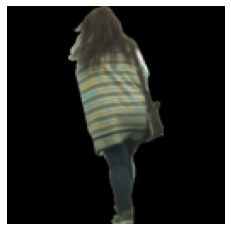

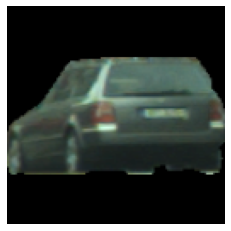

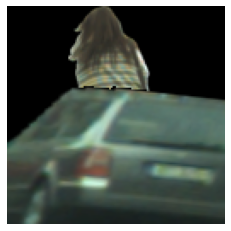

67 -----------------------------------------------------------------------------


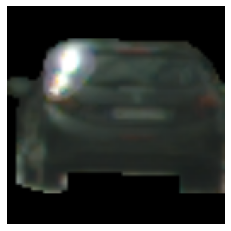

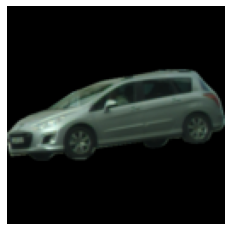

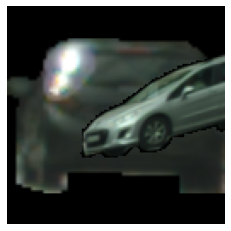

68 -----------------------------------------------------------------------------


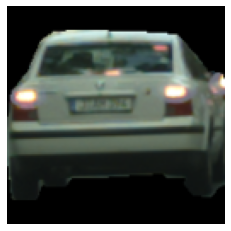

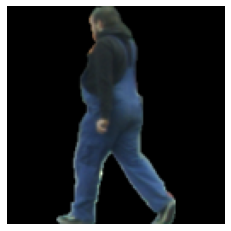

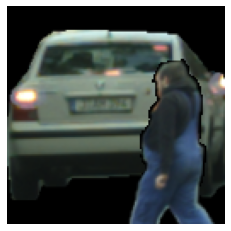

69 -----------------------------------------------------------------------------


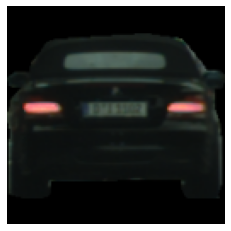

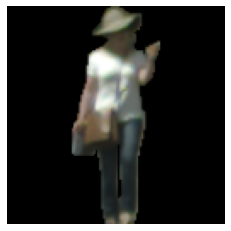

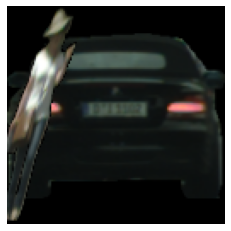

70 -----------------------------------------------------------------------------


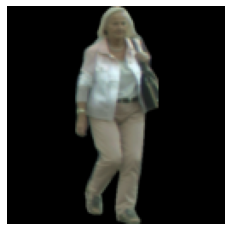

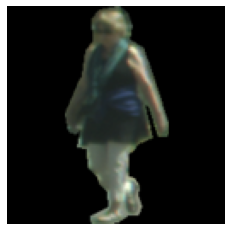

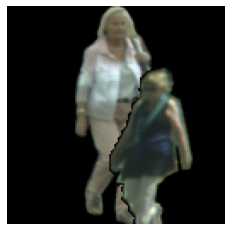

71 -----------------------------------------------------------------------------


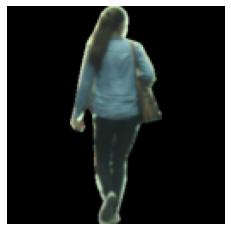

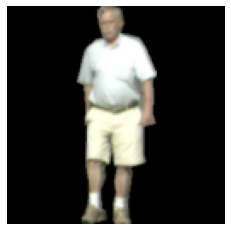

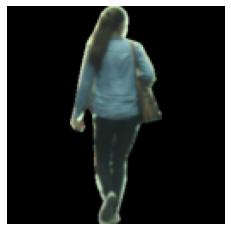

72 -----------------------------------------------------------------------------


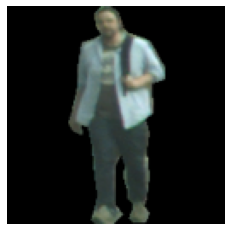

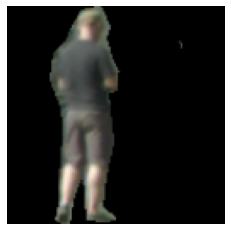

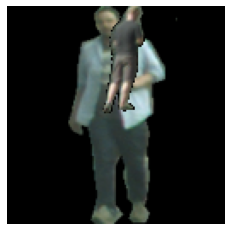

73 -----------------------------------------------------------------------------


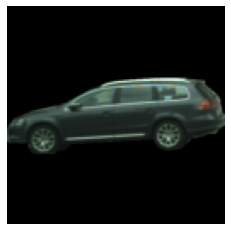

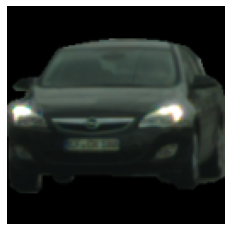

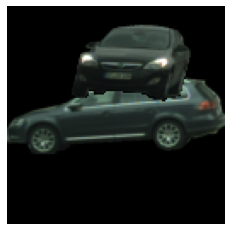

74 -----------------------------------------------------------------------------


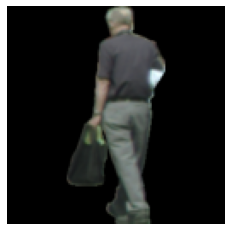

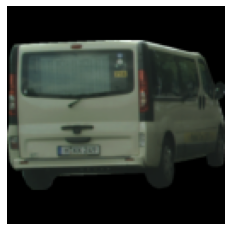

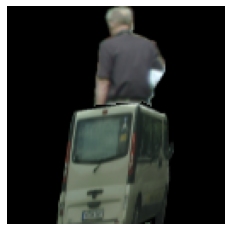

75 -----------------------------------------------------------------------------


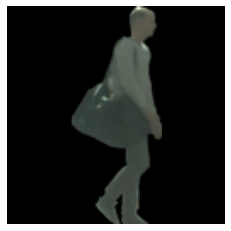

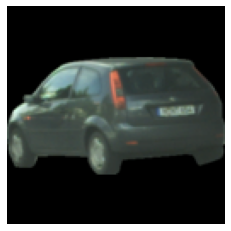

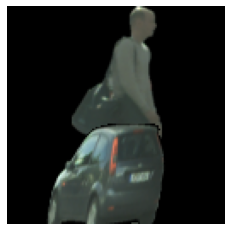

76 -----------------------------------------------------------------------------


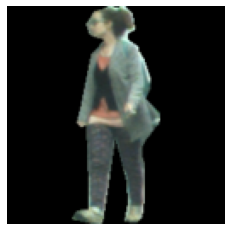

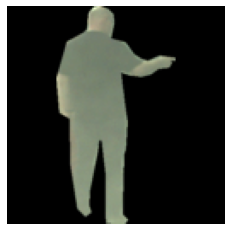

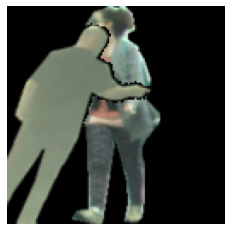

77 -----------------------------------------------------------------------------


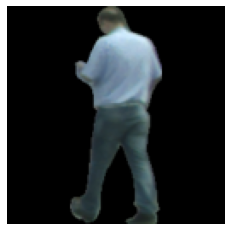

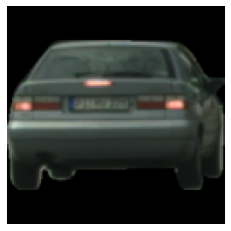

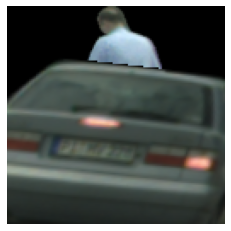

78 -----------------------------------------------------------------------------


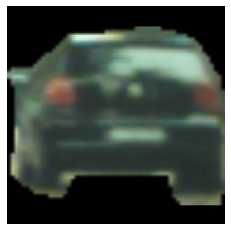

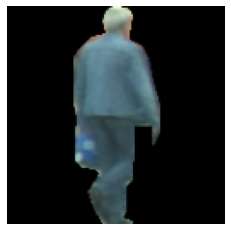

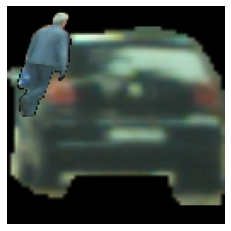

79 -----------------------------------------------------------------------------


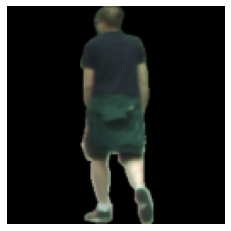

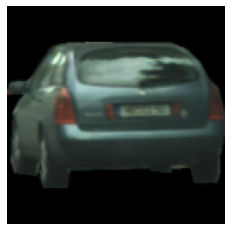

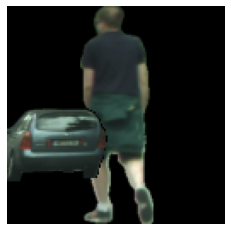

80 -----------------------------------------------------------------------------


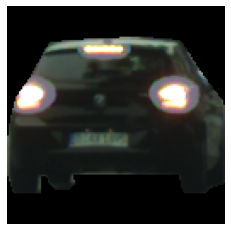

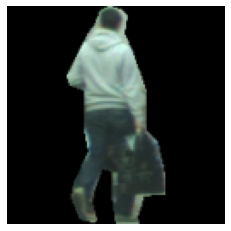

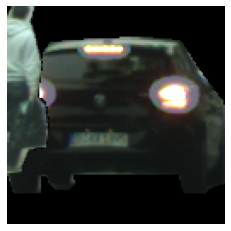

81 -----------------------------------------------------------------------------


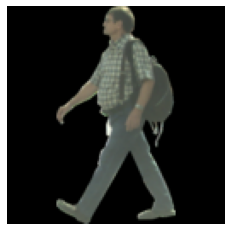

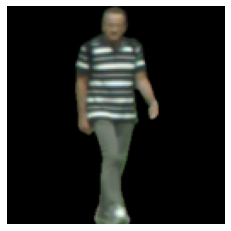

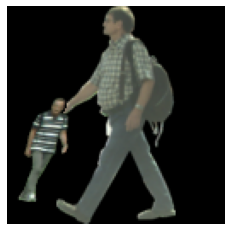

82 -----------------------------------------------------------------------------


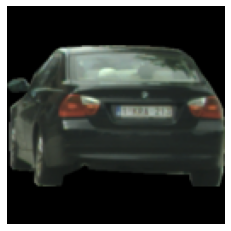

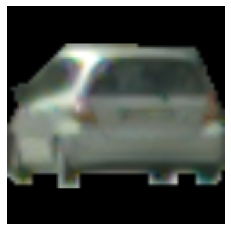

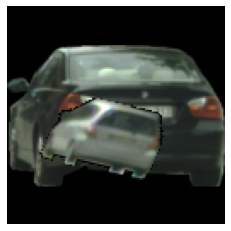

83 -----------------------------------------------------------------------------


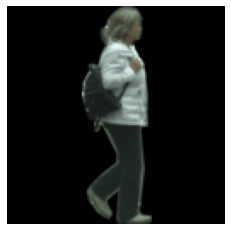

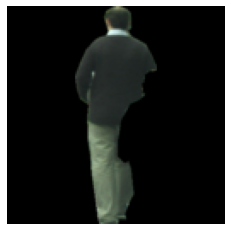

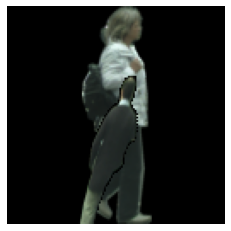

84 -----------------------------------------------------------------------------


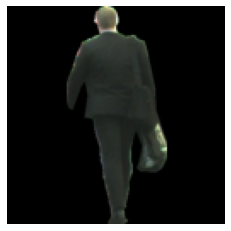

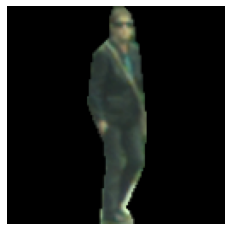

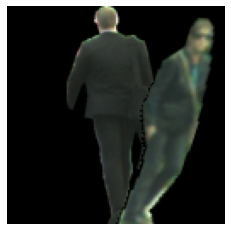

85 -----------------------------------------------------------------------------


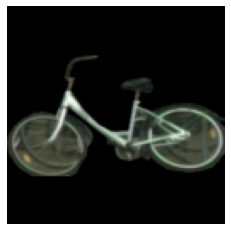

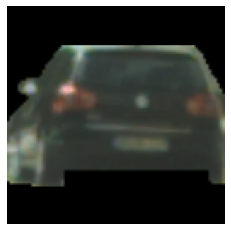

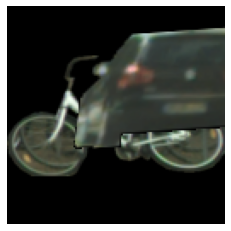

86 -----------------------------------------------------------------------------


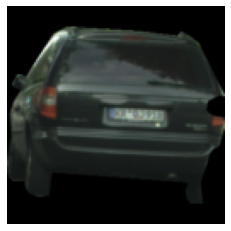

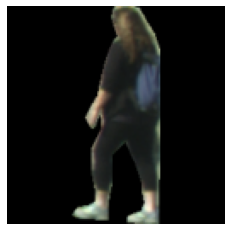

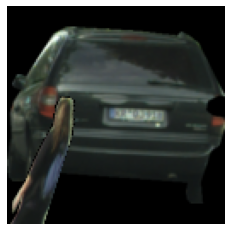

87 -----------------------------------------------------------------------------


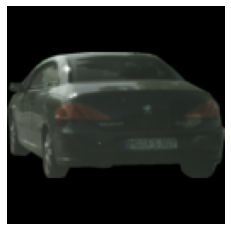

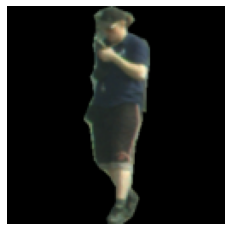

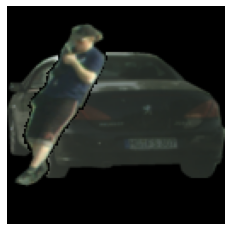

88 -----------------------------------------------------------------------------


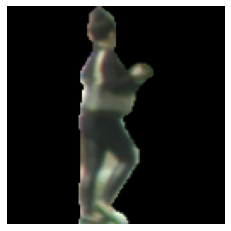

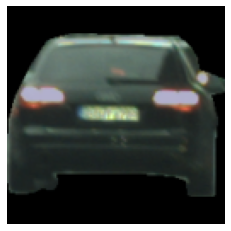

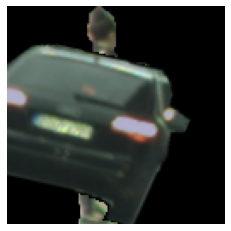

89 -----------------------------------------------------------------------------


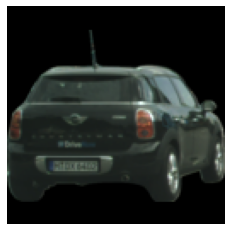

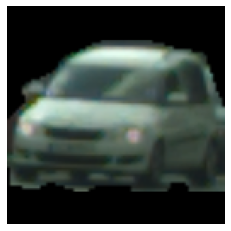

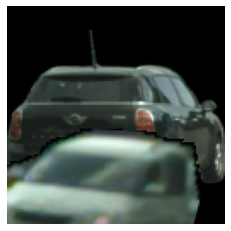

90 -----------------------------------------------------------------------------


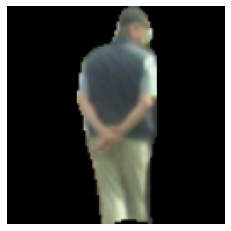

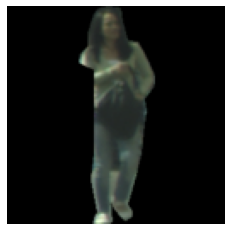

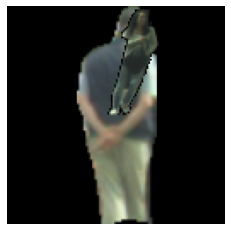

91 -----------------------------------------------------------------------------


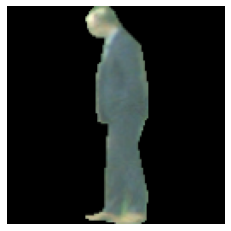

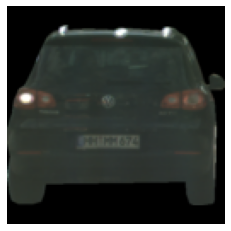

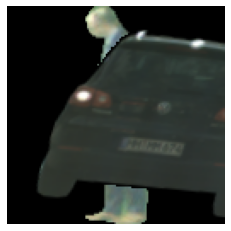

92 -----------------------------------------------------------------------------


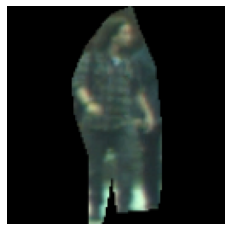

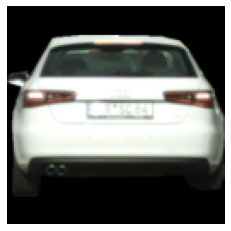

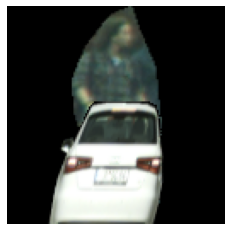

93 -----------------------------------------------------------------------------


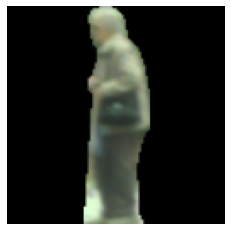

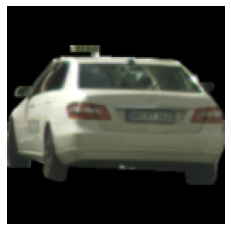

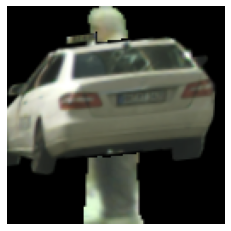

94 -----------------------------------------------------------------------------


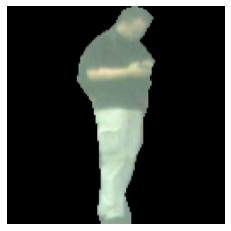

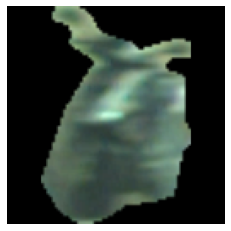

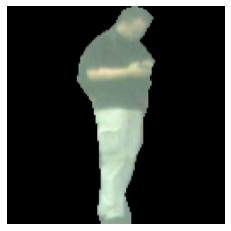

95 -----------------------------------------------------------------------------


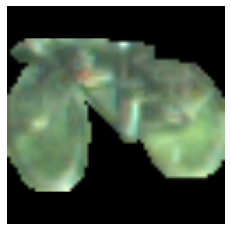

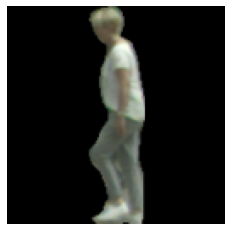

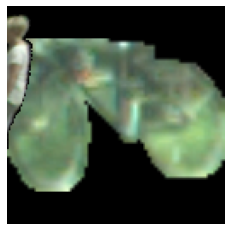

96 -----------------------------------------------------------------------------


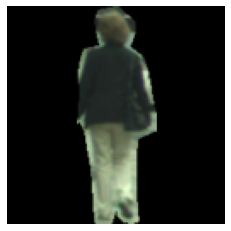

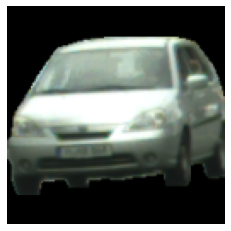

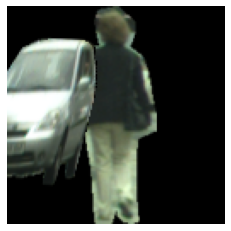

97 -----------------------------------------------------------------------------


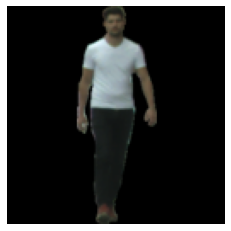

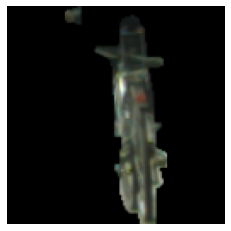

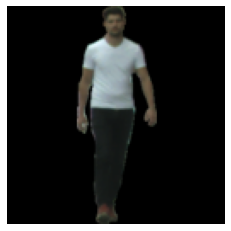

98 -----------------------------------------------------------------------------


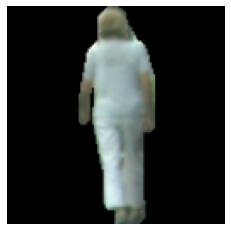

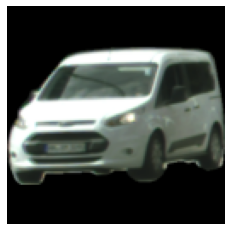

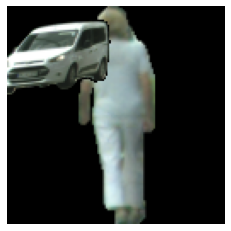

99 -----------------------------------------------------------------------------


In [0]:
from skimage.transform import warp, AffineTransform
dataset = BaselinePairDataset(DATASET_DIR+"/full/")
loader = DataLoader(dataset, batch_size=10)
batch_idx = 0
pic_idx = 0
for (data1,data2) in loader:
  
  brk_flg=0
  for i in range(len(data1)):
    plt.imshow(data1[i])
    plt.axis("off")
    plt.show()
    plt.imshow(data2[i])
    plt.axis("off")
    plt.show()
    sc_int =np.random.randint(6)
    rot_int =np.random.randint(6)
    trans_int =np.random.randint(6)
    image1 = np.zeros(data1[i].shape)
    image2 = np.zeros(data2[i].shape)
    imageFinal = np.zeros(data2[i].shape)
    image1 = data1[i].numpy()
    image2 = data2[i].numpy()
    tform = AffineTransform(scale=scale_values[sc_int], rotation=rotation_values[rot_int], translation=translation_values[trans_int], shear =shear_val)
    image_R = warp(image2[:,:,0], tform.inverse, output_shape=(128, 128))
    image_G = warp(image2[:,:,1], tform.inverse, output_shape=(128, 128))
    image_B = warp(image2[:,:,2], tform.inverse, output_shape=(128, 128))
    imageFinal[:,:,0] = image_R
    imageFinal[:,:,1] = image_G
    imageFinal[:,:,2] = image_B
    
    
    imageFinal = imageFinal*255.0

    xSol = np.any(imageFinal != [0, 0, 0], axis=-1)#fg mask
    # plt.imshow(xSol, cmap='gray')
    # plt.show()
    # plt.imsave("/content/drive/My Drive/522 Project/Datasets/Non_DL_baseline_1/Masks/"+str(pic_idx)+"_fore_mask.png", xSol, cmap="gray")
    
    vals = (np.argwhere(xSol > 0))
    
    xSol1 = np.any(image1 != [0, 0, 0], axis=-1)#bg mask
    # plt.imshow(xSol1, cmap='gray')
    # plt.show()
    # plt.imsave("/content/drive/My Drive/522 Project/Datasets/Non_DL_baseline_1/Masks/"+str(pic_idx)+"_back_mask_gt.png", xSol1, cmap="gray")
    
    xSol2 = np.logical_and((xSol1 ^ xSol),xSol1)
    # plt.imshow(xSol2, cmap='gray')
    # plt.show()
    # plt.imsave("/content/drive/My Drive/522 Project/Datasets/Non_DL_baseline_1/Masks/"+str(pic_idx)+"_back_mask_generated.png", xSol2, cmap="gray")
    
    image1[:,:,0][vals[:,0],vals[:,1]] = imageFinal[:,:,0][vals[:,0],vals[:,1]]
    image1[:,:,1][vals[:,0],vals[:,1]] = imageFinal[:,:,1][vals[:,0],vals[:,1]]
    image1[:,:,2][vals[:,0],vals[:,1]] = imageFinal[:,:,2][vals[:,0],vals[:,1]]
    
    image1 = image1.astype(np.uint8)
    plt.imshow(image1)
    plt.axis("off")
    plt.show()
    # imageio.imwrite("/content/drive/My Drive/522 Project/Datasets/Non_DL_baseline_1/Rgbs/"+str(pic_idx)+"_all_rgb.png", image1)
    
    print(pic_idx,"-----------------------------------------------------------------------------")
    pic_idx +=1
    if(pic_idx==500):
      brk_flg=1
      break
  if(brk_flg==1):
    break
  batch_idx+=1


Cheking if data has been saved


In [0]:
"/content/drive/My Drive/522 Project/Datasets/Non_DL_baseline_1/Rgbs/"+str(pic_idx)+"_all_rgb.png"

In [0]:
for pic_idx in range(501):
  x = plt.imread("/content/drive/My Drive/522 Project/Datasets/Non_DL_baseline_1/Rgbs/"+str(pic_idx)+"_all_rgb.png")
  # print(x.shape, pic_idx)

(128, 128, 3) 0
(128, 128, 3) 1
(128, 128, 3) 2
(128, 128, 3) 3
(128, 128, 3) 4
(128, 128, 3) 5
(128, 128, 3) 6
(128, 128, 3) 7
(128, 128, 3) 8
(128, 128, 3) 9
(128, 128, 3) 10
(128, 128, 3) 11
(128, 128, 3) 12
(128, 128, 3) 13
(128, 128, 3) 14
(128, 128, 3) 15
(128, 128, 3) 16
(128, 128, 3) 17
(128, 128, 3) 18
(128, 128, 3) 19
(128, 128, 3) 20
(128, 128, 3) 21
(128, 128, 3) 22
(128, 128, 3) 23
(128, 128, 3) 24
(128, 128, 3) 25
(128, 128, 3) 26
(128, 128, 3) 27
(128, 128, 3) 28
(128, 128, 3) 29
(128, 128, 3) 30
(128, 128, 3) 31
(128, 128, 3) 32
(128, 128, 3) 33
(128, 128, 3) 34
(128, 128, 3) 35
(128, 128, 3) 36
(128, 128, 3) 37
(128, 128, 3) 38
(128, 128, 3) 39
(128, 128, 3) 40
(128, 128, 3) 41
(128, 128, 3) 42
(128, 128, 3) 43
(128, 128, 3) 44
(128, 128, 3) 45
(128, 128, 3) 46
(128, 128, 3) 47
(128, 128, 3) 48
(128, 128, 3) 49
(128, 128, 3) 50
(128, 128, 3) 51
(128, 128, 3) 52
(128, 128, 3) 53
(128, 128, 3) 54
(128, 128, 3) 55
(128, 128, 3) 56
(128, 128, 3) 57
(128, 128, 3) 58
(128, 1

FileNotFoundError: ignored